## GAN (Generative Adversarial Network)

In [2]:
import tensorflow as tf

if tf.config.list_physical_devices('GPU'):
    print("GPU is available and ready!")
    print(f"GPU device: {tf.config.list_physical_devices('GPU')}")
else:
    print("GPU is not available.")

2025-07-23 15:51:25.080673: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-23 15:51:25.752621: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-23 15:51:26.065822: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-23 15:51:28.156059: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

GPU is available and ready!
GPU device: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2025-07-23 15:51:31.290107: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-23 15:51:31.671796: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-23 15:51:31.674841: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tqdm import tqdm

# Set paths
perfect_path = r"./X"
imperfect_path = r"./imperfect"
output_path = r"./augmented"

os.makedirs(output_path, exist_ok=True)

# List of features
features = [
    "5_Rectangular_pocket_combined.npy"
]

# Imperfect counts
imperfect_counts = {
    "5_rectangular_pocket": 61
}

# Target count
TARGET_COUNT = 3000

# ------------- GAN Components -----------------

def build_generator(latent_dim):
    model = models.Sequential(name="generator")
    model.add(layers.Dense(8*8*8*128, input_dim=latent_dim))
    model.add(layers.Reshape((8, 8, 8, 128)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    
    model.add(layers.Conv3DTranspose(64, 4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    
    model.add(layers.Conv3DTranspose(32, 4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    
    model.add(layers.Conv3DTranspose(1, 4, strides=2, padding='same', activation='sigmoid'))
    return model

def build_discriminator():
    model = models.Sequential(name="discriminator")
    model.add(layers.Conv3D(32, 4, strides=2, padding='same', input_shape=(64, 64, 64, 1)))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv3D(64, 4, strides=2, padding='same'))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# ------------- Training Routine -----------------

def train_gan(feature_name, data, latent_dim=100, epochs=2000, batch_size=16):
    data = data.astype("float32") / 255.0  # Normalize
    data = np.expand_dims(data, axis=-1)  # Add channel dimension
    
    generator = build_generator(latent_dim)
    discriminator = build_discriminator()

    # Compile discriminator
    discriminator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Combined model (generator + frozen discriminator)
    z = layers.Input(shape=(latent_dim,))
    fake = generator(z)
    discriminator.trainable = False
    validity = discriminator(fake)
    combined = models.Model(z, validity)
    combined.compile(optimizer='adam', loss='binary_crossentropy')

    real_labels = np.ones((batch_size, 1))
    fake_labels = np.zeros((batch_size, 1))

    for epoch in tqdm(range(epochs), desc=f"Training {feature_name}"):
        idx = np.random.randint(0, data.shape[0], batch_size)
        real_samples = data[idx]

        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        gen_samples = generator.predict(noise, verbose=0)

        d_loss_real = discriminator.train_on_batch(real_samples, real_labels)
        d_loss_fake = discriminator.train_on_batch(gen_samples, fake_labels)

        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        g_loss = combined.train_on_batch(noise, real_labels)

    return generator

# ------------- Main Execution -----------------

for feature in features:
    print(f"\n[INFO] Processing feature: {feature}")
    base_dir = os.getcwd()
    imperfect_file = os.path.join(base_dir, "imperfect", feature)

    if not os.path.exists(imperfect_file):
        print(f"Skipping {feature} as imperfect data not found.")
        continue

    imperfect_data = np.load(imperfect_file)
    current_count = imperfect_data.shape[0]
    gen_needed = TARGET_COUNT - current_count

    if gen_needed <= 0:
        print(f"Skipping {feature}: already has {current_count} samples.")
        continue

    print(f"Training GAN on {current_count} imperfect samples. Generating {gen_needed} more.")
    gen = train_gan(feature, imperfect_data, epochs=500)

    noise = np.random.normal(0, 1, (gen_needed, 100))
    synthetic_data = gen.predict(noise, verbose=1)
    synthetic_data = (synthetic_data * 255).astype(np.uint8)
    synthetic_data = synthetic_data.squeeze(-1)

    combined = np.concatenate([imperfect_data, synthetic_data], axis=0)
    output_file = os.path.join(base_dir, "augmented", f"{feature}_augmented.npy")
    np.save(output_file, combined)
    print(f"Saved augmented data for {feature}: {combined.shape}")

2025-07-27 12:51:16.264257: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-27 12:51:16.917164: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-27 12:51:17.224775: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-27 12:51:19.024984: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 


[INFO] Processing feature: 5_Rectangular_pocket_combined.npy
Training GAN on 61 imperfect samples. Generating 2939 more.


2025-07-27 12:51:22.179740: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-27 12:51:22.555151: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-27 12:51:22.558191: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-27 12:51:22.563181: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

92/92 [==============================] - 5s 41ms/step
Saved augmented data for 5_Rectangular_pocket_combined.npy: (3000, 64, 64, 64)


In [5]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tqdm import tqdm

# Paths
base_dir = os.getcwd()
perfect_path = os.path.join(base_dir, "X")
imperfect_path = os.path.join(base_dir, "imperfect")
output_path = os.path.join(base_dir, "augmented")
os.makedirs(output_path, exist_ok=True)

# Parameters
features = ["5_Rectangular_pocket_combined.npy"]
TARGET_COUNT = 3000
LATENT_DIM = 100
EPOCHS = 500
BATCH_SIZE = 16
PRINT_EVERY = 100

# Generator
def build_generator(latent_dim):
    model = models.Sequential(name="generator")
    model.add(layers.Dense(8*8*8*128, input_dim=latent_dim))
    model.add(layers.Reshape((8, 8, 8, 128)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3DTranspose(64, 4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3DTranspose(32, 4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3DTranspose(1, 4, strides=2, padding='same', activation='sigmoid'))
    return model

# Discriminator
def build_discriminator():
    model = models.Sequential(name="discriminator")
    model.add(layers.Conv3D(32, 4, strides=2, padding='same', input_shape=(64, 64, 64, 1)))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))
    model.add(layers.Conv3D(64, 4, strides=2, padding='same'))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Dropout(0.3))
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# GAN Training
def train_gan(feature_name, imperfect_data, perfect_data):
    # Normalize
    imperfect_data = imperfect_data.astype("float32") / 255.0
    perfect_data = perfect_data.astype("float32") / 255.0
    imperfect_data = np.expand_dims(imperfect_data, axis=-1)
    perfect_data = np.expand_dims(perfect_data, axis=-1)

    generator = build_generator(LATENT_DIM)
    discriminator = build_discriminator()
    discriminator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    z = layers.Input(shape=(LATENT_DIM,))
    fake = generator(z)
    discriminator.trainable = False
    validity = discriminator(fake)
    combined = models.Model(z, validity)
    combined.compile(optimizer='adam', loss='binary_crossentropy')

    real_labels = np.ones((BATCH_SIZE, 1))
    fake_labels = np.zeros((BATCH_SIZE, 1))

    d_losses, g_losses = [], []
    val_d_losses, val_accs_imp, val_accs_perf = [], [], []
    val_log_epochs = []

    for epoch in tqdm(range(EPOCHS), desc=f"Training {feature_name}"):
        idx = np.random.randint(0, imperfect_data.shape[0], BATCH_SIZE)
        real_samples = imperfect_data[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        gen_samples = generator.predict(noise, verbose=0)

        d_loss_real = discriminator.train_on_batch(real_samples, real_labels)
        d_loss_fake = discriminator.train_on_batch(gen_samples, fake_labels)
        d_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])
        d_acc = 0.5 * (d_loss_real[1] + d_loss_fake[1])

        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        g_loss = combined.train_on_batch(noise, real_labels)

        d_losses.append(d_loss)
        g_losses.append(g_loss)

        if epoch % PRINT_EVERY == 0 or epoch == EPOCHS - 1:
            val_log_epochs.append(epoch)

            val_idx_imp = np.random.randint(0, imperfect_data.shape[0], BATCH_SIZE)
            val_idx_perf = np.random.randint(0, perfect_data.shape[0], BATCH_SIZE)

            val_loss_imp, val_acc_imp = discriminator.evaluate(imperfect_data[val_idx_imp], real_labels, verbose=0)
            val_loss_perf, val_acc_perf = discriminator.evaluate(perfect_data[val_idx_perf], fake_labels, verbose=0)

            val_d_losses.append((val_loss_imp + val_loss_perf) / 2)
            val_accs_imp.append(val_acc_imp)
            val_accs_perf.append(val_acc_perf)

            print(f"Epoch {epoch}/{EPOCHS} | D Loss: {d_loss:.4f} | G Loss: {g_loss:.4f} | "
                  f"Val D Loss: {(val_loss_imp + val_loss_perf)/2:.4f} | "
                  f"Val Acc Imp: {val_acc_imp:.4f} | Val Acc Perf: {val_acc_perf:.4f}")

    # Plotting
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(d_losses, label='Discriminator Loss')
    plt.plot(g_losses, label='Generator Loss')
    plt.plot(val_log_epochs, val_d_losses, label='Val D Loss')
    plt.title(f'Losses - {feature_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(val_log_epochs, val_accs_imp, label='Val Acc Imperfect')
    plt.plot(val_log_epochs, val_accs_perf, label='Val Acc Perfect')
    plt.title(f'D Accuracy - {feature_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return generator

# ==== Main Execution ====
for feature in features:
    print(f"\n[INFO] Processing feature: {feature}")

    imperfect_file = os.path.join(imperfect_path, feature)
    perfect_file = os.path.join(perfect_path, feature.replace("_combined.npy", "_concatenated.npy"))

    if not os.path.exists(imperfect_file) or not os.path.exists(perfect_file):
        print(f"❌ Skipping {feature}: file missing.")
        continue

    imperfect_data = np.load(imperfect_file)
    perfect_data = np.load(perfect_file)

    current_count = imperfect_data.shape[0]
    gen_needed = TARGET_COUNT - current_count

    if gen_needed <= 0:
        print(f"✅ Skipping {feature}: already has enough samples ({current_count})")
        continue

    print(f"🔧 Training GAN on {current_count} samples. Need {gen_needed} more...")

    gen_model = train_gan(feature, imperfect_data, perfect_data)

    noise = np.random.normal(0, 1, (gen_needed, LATENT_DIM))
    synthetic_data = gen_model.predict(noise, verbose=1)
    synthetic_data = (synthetic_data * 255).astype(np.uint8).squeeze(-1)

    combined = np.concatenate([imperfect_data, synthetic_data], axis=0)
    output_file = os.path.join(output_path, f"{feature}_augmented.npy")
    np.save(output_file, combined)

    print(f"✅ Saved augmented file: {output_file} | Final shape: {combined.shape}")


[INFO] Processing feature: 5_Rectangular_pocket_combined.npy
❌ Skipping 5_Rectangular_pocket_combined.npy: file missing.


## 3D-CNN (Accuracy 99-94% with 30 Epochs)

2025-07-27 17:45:43.475135: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-27 17:45:44.123506: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-27 17:45:44.433766: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-27 17:45:46.226255: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

✅ Loaded X/6_triangular_pocket_concatenated.npy: shape (2995, 64, 64, 64)
✅ Loaded X/1_circular_end_pocket_concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded X/0_Oring_concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded X/2_v_circular_end_blind_slot_concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded X/4_non_rectangular_pocket__concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded X/3_circular_pocket_concatenated.npy: shape (2392, 64, 64, 64)
✅ Loaded X/5_rectangular_pocket_concatenated.npy: shape (2989, 64, 64, 64)
(20380, 64, 64, 64)
X shape: (20380, 64, 64, 64, 1)
y shape: (20381,)
Number of classes: 7


2025-07-27 17:46:34.231605: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

2025-07-27 17:46:34.546038: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-27 17:46:34.548844: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-27 17:46:34.553095: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-27 17:46:34.554071: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so ret

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
ocalhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localho

2025-07-27 17:46:39.408556: I tensorflow/core/common_runtime/placer.cc:114] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:39.408602: I tensorflow/core/common_runtime/placer.cc:114] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:39.408608: I tensorflow/core/common_runtime/placer.cc:114] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:39.408616: I tensorflow/core/common_runtime/placer.cc:114] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:39.408622: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:39.415348: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:39.415370: I tensorflow/core/common_runtime/placer.cc:114] count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:4

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2025-07-27 17:46:40.352661: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.352690: I tensorflow/core/common_runtime/placer.cc:114] count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.352700: I tensorflow/core/common_runtime/placer.cc:114] RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.352706: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.355055: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.355079: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.355087: I tensorflow/core/common_runtime/placer.cc:114] ZipDataset: (ZipDataset): /job:localhost/replic

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in

2025-07-27 17:46:40.603148: I tensorflow/core/common_runtime/placer.cc:114] dims: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.603169: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 17:46:40.603178: I tensorflow/core/common_runtime/placer.cc:114] Fill: (Fill): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 17:46:40.603183: I tensorflow/core/common_runtime/placer.cc:114] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0


lica:0/task:0/device:CPU:0
args_2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2_1: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Identity_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
identity_1_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2_1/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
dims: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
Fill: (Fill): /job:localhost/replica:0/task:0/device:GPU:0
output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
sequential_conv3d_conv3d_readvaria

2025-07-27 17:46:40.921021: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:46:40.921049: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_conv3d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 17:46:40.921056: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 17:46:40.921061: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_1_conv3d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 17:46:40.921066: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_1_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 17:46:40.921070: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_2_conv3d_readvariableop_resource: (_Arg): /jo

  1/510 [..............................] - ETA: 25:10 - loss: 1.9548 - accuracy: 0.1250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_945 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/510 [..............................] - ETA: 2:15 - loss: 2.5303 - accuracy: 0.1406 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_945 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/510 [..............................] - ETA: 2:14 - loss: 2.3924 - accuracy: 0.1354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_945 in device /job:loc

2025-07-27 17:48:59.948375: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:48:59.948410: I tensorflow/core/common_runtime/placer.cc:114] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:48:59.948417: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:48:59.950629: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:48:59.950649: I tensorflow/core/common_runtime/placer.cc:114] buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:48:59.950658: I tensorflow/core/common_runtime/placer.cc:114] PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:48:59.950664: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVar

2025-07-27 17:49:00.170306: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:49:00.170329: I tensorflow/core/common_runtime/placer.cc:114] count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:49:00.170337: I tensorflow/core/common_runtime/placer.cc:114] RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:49:00.170343: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:49:00.171926: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:49:00.171948: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:49:00.171956: I tensorflow/core/common_runtime/placer.cc:114] ZipDataset: (ZipDataset): /job:localhost/replic

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 17:51:27.425202: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:51:27.425238: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:51:27.425245: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:51:27.425251: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:51:27.425256: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:51:27.425262: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:51:27.425267: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 17:53:54.283352: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:53:54.283390: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:53:54.283397: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:53:54.283403: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:53:54.283409: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:53:54.283414: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:53:54.283420: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 17:56:21.195863: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:56:21.195896: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:56:21.195903: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:56:21.195909: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:56:21.195915: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:56:21.195921: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:56:21.195927: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 17:58:48.084647: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:58:48.084679: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:58:48.084686: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:58:48.084691: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:58:48.084697: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:58:48.084703: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 17:58:48.084710: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:01:15.062069: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:01:15.062106: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:01:15.062122: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:01:15.062128: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:01:15.062134: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:01:15.062140: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:01:15.062147: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:03:41.928859: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:03:41.928892: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:03:41.928900: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:03:41.928905: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:03:41.928911: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:03:41.928922: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:03:41.928928: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:06:08.544934: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:06:08.544970: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:06:08.544977: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:06:08.544983: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:06:08.544989: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:06:08.544994: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:06:08.545000: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:08:35.025607: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:08:35.025639: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:08:35.025646: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:08:35.025652: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:08:35.025658: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:08:35.025663: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:08:35.025669: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:11:01.288892: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:11:01.288924: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:11:01.288931: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:11:01.288937: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:11:01.288943: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:11:01.288948: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:11:01.288955: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:13:27.868014: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:13:27.868049: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:13:27.868057: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:13:27.868062: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:13:27.868069: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:13:27.868074: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:13:27.868080: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:15:54.414209: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:15:54.414243: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:15:54.414251: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:15:54.414256: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:15:54.414262: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:15:54.414268: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:15:54.414274: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:18:21.327008: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:18:21.327042: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:18:21.327049: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:18:21.327055: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:18:21.327061: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:18:21.327066: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:18:21.327073: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:20:48.108307: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:20:48.108343: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:20:48.108350: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:20:48.108356: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:20:48.108362: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:20:48.108367: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:20:48.108373: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:23:14.683845: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:23:14.683880: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:23:14.683887: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:23:14.683893: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:23:14.683899: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:23:14.683904: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:23:14.683911: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:25:41.104632: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:25:41.104663: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:25:41.104670: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:25:41.104675: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:25:41.104681: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:25:41.104687: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:25:41.104694: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:28:07.482076: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:28:07.482120: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:28:07.482130: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:28:07.482135: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:28:07.482141: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:28:07.482147: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:28:07.482153: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:30:34.032092: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:30:34.032130: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:30:34.032138: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:30:34.032149: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:30:34.032155: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:30:34.032161: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:30:34.032168: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:33:00.352667: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:33:00.352701: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:33:00.352708: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:33:00.352713: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:33:00.352719: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:33:00.352724: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:33:00.352730: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:35:26.580263: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:35:26.580298: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:35:26.580305: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:35:26.580311: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:35:26.580317: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:35:26.580322: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:35:26.580328: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:37:52.620755: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:37:52.620789: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:37:52.620796: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:37:52.620801: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:37:52.620807: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:37:52.620813: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:37:52.620819: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



237/510 [============>.................] - ETA: 1:12 - loss: 0.0102 - accuracy: 0.9972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_945 in device /job:localhost/replica:0/task:0/device:GPU:0
238/510 [=============>................] - ETA: 1:11 - loss: 0.0102 - accuracy: 0.9972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_945 in device /job:localhost/replica:0/task:0/device:GPU:0
239/510 [=============>................] - ETA: 1:11 - loss: 0.0101 - accuracy: 0.9973Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_945 in device /job:local

2025-07-27 18:52:29.059249: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:52:29.059286: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:52:29.059293: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:52:29.059299: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:52:29.059304: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:52:29.059309: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:52:29.059316: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:54:55.079584: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:54:55.079617: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:54:55.079624: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:54:55.079630: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:54:55.079636: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:54:55.079642: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:54:55.079649: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:57:21.256745: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:57:21.256780: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:57:21.256797: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:57:21.256805: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:57:21.256814: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:57:21.256822: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:57:21.256831: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

2025-07-27 18:59:47.604617: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:59:47.604649: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:59:47.604656: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:59:47.604662: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:59:47.604668: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:59:47.604673: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 18:59:47.604679: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_3179 in device /job:loca

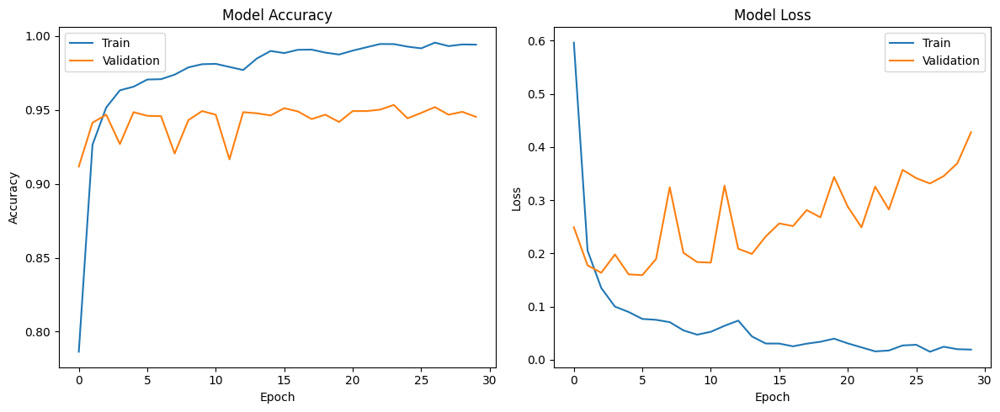

In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# === Load X dataset ===
X_data_path = r'X'
X_files = [os.path.join(X_data_path, f) for f in os.listdir(X_data_path) if f.endswith('.npy')]

X_list = []
invalid_files = []

for file in X_files:
    try:
        data = np.load(file)
        if data.ndim != 4 or data.shape[1:] != (64, 64, 64):
            print(f"❌ Skipping {file}: Invalid shape {data.shape}")
            invalid_files.append(file)
            continue
        X_list.append(data)
        print(f"✅ Loaded {file}: shape {data.shape}")
    except Exception as e:
        print(f"❌ Error loading {file}: {e}")
        invalid_files.append(file)

X = np.concatenate(X_list, axis=0)
print(X.shape)
# Expand dimensions for CNN input: (samples, 64, 64, 64, 1)
X = X[..., np.newaxis]
print("X shape:", X.shape)

# === Load Y labels ===
Y_path = r'Y.npy'
y = np.load(Y_path)
print("y shape:", y.shape)

# Encode labels to integers
le = LabelEncoder()
y_encoded = le.fit_transform(y)
num_classes = len(np.unique(y_encoded))
print("Number of classes:", num_classes)

min_len = min(X.shape[0], y.shape[0])
X = X[:min_len]
y_encoded = y_encoded[:min_len]

tf.debugging.set_log_device_placement(True)

# === Train-test split ===
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# === Build 3D CNN Model ===
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(64, 64, 64, 1)),
    tf.keras.layers.Conv3D(32, 3, activation='relu'),
    tf.keras.layers.MaxPool3D(),
    tf.keras.layers.Conv3D(64, 3, activation='relu'),
    tf.keras.layers.MaxPool3D(),
    tf.keras.layers.Conv3D(128, 3, activation='relu'),
    tf.keras.layers.MaxPool3D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

# === Train the model ===
history = model.fit(X_train, y_train, epochs=30, batch_size=32,
                    validation_data=(X_test, y_test))

# === Plot training history ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

## 3D CNN with Augmented Data

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# === Load Perfect Data ===
perfect_path = './X'
X_files = [os.path.join(perfect_path, f) for f in os.listdir(perfect_path) if f.endswith('.npy')]

X_list = []
invalid_X_files = []

for file in X_files:
    try:
        data = np.load(file)
        if data.ndim != 4 or data.shape[1:] != (64, 64, 64):
            print(f"❌ Skipping {file}: Invalid shape {data.shape}")
            invalid_X_files.append(file)
            continue
        X_list.append(data)
        print(f"✅ Loaded {file}: shape {data.shape}")
    except Exception as e:
        print(f"❌ Error loading {file}: {e}")
        invalid_X_files.append(file)

X = np.concatenate(X_list, axis=0)
X = X[..., np.newaxis]  # (N, 64, 64, 64, 1)
print("✅ Final X shape:", X.shape)

# === Load Y labels for perfect data ===
Y_path = './Y.npy'
y = np.load(Y_path)
print("✅ Loaded labels:", y.shape)

# Label encode
le = LabelEncoder()
y_encoded = le.fit_transform(y)
num_classes = len(np.unique(y_encoded))

# Truncate to match shape if needed
min_len = min(X.shape[0], y_encoded.shape[0])
X = X[:min_len]
y_encoded = y_encoded[:min_len]

# === Load Augmented Imperfect Data ===
augmented_path = './augmented'
aug_files = [f for f in os.listdir(augmented_path) if f.endswith('_augmented.npy')]

augmented_list = []
for file in aug_files:
    try:
        data = np.load(os.path.join(augmented_path, file))
        if data.ndim != 4 or data.shape[1:] != (64, 64, 64):
            print(f"❌ Skipping {file} due to bad shape: {data.shape}")
            continue
        augmented_list.append(data)
        print(f"📦 Loaded {file}: {data.shape}")
    except Exception as e:
        print(f"❌ Error loading {file}: {e}")

augmented_data = np.concatenate(augmented_list, axis=0)
augmented_data = augmented_data[..., np.newaxis]  # Shape: (M, 64, 64, 64, 1)
print("✅ Augmented shape:", augmented_data.shape)

from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# === Train-Test Split (on perfect data) ===
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# === Define the 3D CNN Model ===
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(64, 64, 64, 1)),
    tf.keras.layers.Conv3D(16, 3, activation='relu'),
    tf.keras.layers.MaxPooling3D(2),
    tf.keras.layers.Conv3D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling3D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

# === Train Model ===
history = model.fit(X_train, y_train, epochs=5, batch_size=8,
                    validation_data=(X_test, y_test))

# === Plot Accuracy & Loss ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

2025-07-27 13:41:17.289148: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-27 13:41:17.865480: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-27 13:41:18.130161: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-27 13:41:19.678477: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

✅ Loaded ./X/6_triangular_pocket_concatenated.npy: shape (2995, 64, 64, 64)
✅ Loaded ./X/1_circular_end_pocket_concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded ./X/0_Oring_concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded ./X/2_v_circular_end_blind_slot_concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded ./X/4_non_rectangular_pocket__concatenated.npy: shape (3001, 64, 64, 64)
✅ Loaded ./X/3_circular_pocket_concatenated.npy: shape (2392, 64, 64, 64)
✅ Loaded ./X/5_rectangular_pocket_concatenated.npy: shape (2989, 64, 64, 64)
✅ Final X shape: (20380, 64, 64, 64, 1)
✅ Loaded labels: (20381,)
📦 Loaded 2_v_circular_end_blind_slot_combined.npy_augmented.npy: (3000, 64, 64, 64)
📦 Loaded 1_circular_end_pocket_combined.npy_augmented.npy: (3000, 64, 64, 64)
📦 Loaded 3_circular_pocket_combined.npy_augmented.npy: (3000, 64, 64, 64)
📦 Loaded 6_triangular_pocket_combined.npy_augmented.npy: (3000, 64, 64, 64)
📦 Loaded 4_non-rectangular_pocket_combined.npy_augmented.npy: (3000, 64, 64, 64)
📦 Load

## According to FeatureNet Architecture (Accur 99-95% with 30 Epochs)

In [3]:
from tensorflow.keras.backend import clear_session
import gc

clear_session()  # Clear Keras session
gc.collect()  # Collect garbage

1108

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
dDims/dim: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/strided_slice/stack: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/strided_slice/stack_1: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/strided_slice/stack_2: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/Reshape_1/shape/0: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/weighted_loss/Const: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/weighted_loss/Const_1: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sparse_categorical_crossentropy/weighted_loss/Rank: (Const): /job:localhost/replica:0/task:0/device:GPU:0
sp

2025-07-27 19:28:00.585345: I tensorflow/core/common_runtime/placer.cc:114] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:00.585383: I tensorflow/core/common_runtime/placer.cc:114] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:00.587342: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:00.587358: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:00.587366: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:00.593604: I tensorflow/core/common_runtime/placer.cc:114] input: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:00.593624: I tensorflow/core/common_runtime/placer.cc:114] _EagerConst: (_EagerConst): /job:localhost/replica:0/tas

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0


2025-07-27 19:28:02.414858: I tensorflow/core/common_runtime/placer.cc:114] input: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:02.414890: I tensorflow/core/common_runtime/placer.cc:114] _EagerConst: (_EagerConst): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:02.414896: I tensorflow/core/common_runtime/placer.cc:114] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:02.417447: I tensorflow/core/common_runtime/placer.cc:114] start: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:02.417469: I tensorflow/core/common_runtime/placer.cc:114] stop: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:02.417475: I tensorflow/core/common_runtime/placer.cc:114] step: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:02.417482: I tensorflow/core/common_runtime/placer.cc:114] RangeDataset: (RangeDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
sk:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0


2025-07-27 19:28:03.252531: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.252553: I tensorflow/core/common_runtime/placer.cc:114] count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.252578: I tensorflow/core/common_runtime/placer.cc:114] RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.252584: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.254369: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.254391: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.254399: I tensorflow/core/common_runtime/placer.cc:114] ZipDataset: (ZipDataset): /job:localhost/replic

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
job:localhost/replica:0/task:0/device:CPU:0
GatherV2_1/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
dims: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
Fill: (Fill): /job:localhost/replica:0/task:0/device:GPU:0
output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:

2025-07-27 19:28:03.677155: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:28:03.677180: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_conv3d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:03.677186: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:03.677191: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_1_conv3d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:03.677196: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_1_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2025-07-27 19:28:03.677201: I tensorflow/core/common_runtime/placer.cc:114] sequential_conv3d_2_conv3d_readvariableop_resource: (_Arg): /jo

   1/1019 [..............................] - ETA: 16:12 - loss: 1.9652 - accuracy: 0.1250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_80084 in device /job:localhost/replica:0/task:0/device:GPU:0
   2/1019 [..............................] - ETA: 1:22 - loss: 2.1709 - accuracy: 0.1250 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_80084 in device /job:localhost/replica:0/task:0/device:GPU:0
   3/1019 [..............................] - ETA: 1:22 - loss: 2.1150 - accuracy: 0.1875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_80084 in dev

2025-07-27 19:29:27.636630: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.636664: I tensorflow/core/common_runtime/placer.cc:114] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.636671: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.638828: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.638850: I tensorflow/core/common_runtime/placer.cc:114] buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.638858: I tensorflow/core/common_runtime/placer.cc:114] PrefetchDataset: (PrefetchDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.638864: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost

Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVar

2025-07-27 19:29:27.854432: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.854457: I tensorflow/core/common_runtime/placer.cc:114] count: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.854465: I tensorflow/core/common_runtime/placer.cc:114] RepeatDataset: (RepeatDataset): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.854471: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.856052: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.856073: I tensorflow/core/common_runtime/placer.cc:114] input__datasets_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:29:27.856081: I tensorflow/core/common_runtime/placer.cc:114] ZipDataset: (ZipDataset): /job:localhost/replic

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:30:58.009391: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:30:58.009428: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:30:58.009435: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:30:58.009441: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:30:58.009447: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:30:58.009452: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:30:58.009457: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:32:28.043445: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:32:28.043480: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:32:28.043487: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:32:28.043493: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:32:28.043499: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:32:28.043505: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:32:28.043511: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:33:57.874041: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:33:57.874076: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:33:57.874083: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:33:57.874088: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:33:57.874095: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:33:57.874100: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:33:57.874106: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:35:27.583418: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:35:27.583453: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:35:27.583461: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:35:27.583466: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:35:27.583472: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:35:27.583478: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:35:27.583484: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:36:57.330458: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:36:57.330492: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:36:57.330499: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:36:57.330505: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:36:57.330511: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:36:57.330517: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:36:57.330523: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:38:27.102494: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:38:27.102529: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:38:27.102535: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:38:27.102541: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:38:27.102547: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:38:27.102553: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:38:27.102581: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

2025-07-27 19:39:56.830525: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:39:56.830579: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:39:56.830588: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:39:56.830593: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:39:56.830600: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:39:56.830605: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:39:56.830611: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:41:26.563538: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:41:26.563596: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:41:26.563604: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:41:26.563610: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:41:26.563616: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:41:26.563622: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:41:26.563628: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:42:56.226493: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:42:56.226528: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:42:56.226535: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:42:56.226541: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:42:56.226547: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:42:56.226552: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:42:56.226579: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:44:25.900833: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:44:25.900868: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:44:25.900881: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:44:25.900887: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:44:25.900892: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:44:25.900898: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:44:25.900904: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:45:55.603779: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:45:55.603811: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:45:55.603818: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:45:55.603824: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:45:55.603830: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:45:55.603835: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:45:55.603842: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

2025-07-27 19:47:25.395445: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:47:25.395483: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:47:25.395493: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:47:25.395501: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:47:25.395509: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:47:25.395517: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:47:25.395526: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:48:55.075106: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:48:55.075142: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:48:55.075149: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:48:55.075155: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:48:55.075161: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:48:55.075166: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:48:55.075173: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:50:24.755046: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:50:24.755083: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:50:24.755090: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:50:24.755095: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:50:24.755101: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:50:24.755106: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:50:24.755113: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:51:54.414637: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:51:54.414669: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:51:54.414676: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:51:54.414682: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:51:54.414688: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:51:54.414694: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:51:54.414700: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:53:24.076481: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:53:24.076515: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:53:24.076522: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:53:24.076528: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:53:24.076534: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:53:24.076540: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:53:24.076547: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:54:53.735037: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:54:53.735075: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:54:53.735086: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:54:53.735093: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:54:53.735102: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:54:53.735110: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:54:53.735119: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:56:23.325640: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:56:23.325672: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:56:23.325679: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:56:23.325685: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:56:23.325691: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:56:23.325696: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:56:23.325702: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:57:52.940127: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:57:52.940163: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:57:52.940170: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:57:52.940175: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:57:52.940181: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:57:52.940186: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:57:52.940197: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 19:59:22.572409: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:59:22.572445: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:59:22.572452: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:59:22.572458: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:59:22.572464: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:59:22.572469: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 19:59:22.572476: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:00:52.163141: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:00:52.163183: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:00:52.163191: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:00:52.163196: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:00:52.163202: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:00:52.163208: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:00:52.163214: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:02:21.704877: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:02:21.704908: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:02:21.704915: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:02:21.704921: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:02:21.704928: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:02:21.704933: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:02:21.704940: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:03:51.261346: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:03:51.261383: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:03:51.261393: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:03:51.261400: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:03:51.261409: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:03:51.261417: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:03:51.261425: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:05:20.828438: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:05:20.828474: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:05:20.828482: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:05:20.828487: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:05:20.828493: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:05:20.828498: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:05:20.828504: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

2025-07-27 20:06:50.368086: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:06:50.368122: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:06:50.368129: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:06:50.368135: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:06:50.368141: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:06:50.368146: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:06:50.368153: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:08:19.906129: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:08:19.906164: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:08:19.906171: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:08:19.906177: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:08:19.906183: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:08:19.906188: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:08:19.906194: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:09:49.476053: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:09:49.476085: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:09:49.476092: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:09:49.476098: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:09:49.476104: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:09:49.476110: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:09:49.476117: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:11:19.067591: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:11:19.067623: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:11:19.067630: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:11:19.067636: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:11:19.067642: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:11:19.067647: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:11:19.067654: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

2025-07-27 20:12:48.645396: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:12:48.645432: I tensorflow/core/common_runtime/placer.cc:114] range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:12:48.645439: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:12:48.645445: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:12:48.645451: I tensorflow/core/common_runtime/placer.cc:114] range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:12:48.645457: I tensorflow/core/common_runtime/placer.cc:114] range/limit: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-07-27 20:12:48.645464: I tensorflow/core/common_runtime/placer.cc:114] range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2025-

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_84354 in device /job:

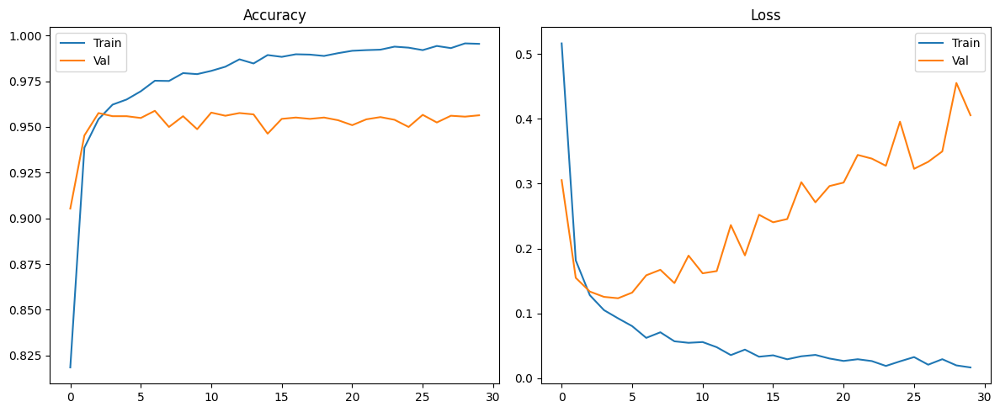

In [5]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# === Load dataset ===
X_data_path = r'X'
X_files = [os.path.join(X_data_path, f) for f in os.listdir(X_data_path) if f.endswith('.npy')]

X_list = []
for file in X_files:
    try:
        data = np.load(file)
        if data.shape[1:] == (64, 64, 64):
            X_list.append(data)
    except Exception as e:
        print(f"Error loading {file}: {e}")

X = np.concatenate(X_list, axis=0)
X = X[..., np.newaxis]  # Shape: (samples, 64, 64, 64, 1)

# === Load labels ===
y = np.load('Y.npy')

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Trim to equal length
min_len = min(X.shape[0], y_encoded.shape[0])
X = X[:min_len]
y_encoded = y_encoded[:min_len]

# === Split data ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42)

# === Build FeatureNet model ===
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(64, 64, 64, 1)),

    tf.keras.layers.Conv3D(16, kernel_size=3, activation='relu', padding='same'),
    tf.keras.layers.MaxPool3D(pool_size=2),

    tf.keras.layers.Conv3D(32, kernel_size=3, activation='relu', padding='same'),
    tf.keras.layers.MaxPool3D(pool_size=2),

    tf.keras.layers.Conv3D(64, kernel_size=3, activation='relu', padding='same'),
    tf.keras.layers.MaxPool3D(pool_size=2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(len(np.unique(y_encoded)), activation='softmax')
])


# Enable mixed precision
from tensorflow.keras import mixed_precision

policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

# === Train ===
history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test),
                    epochs=30,
                    batch_size=16)

# === Plot results ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

## Difference

1. Number of Convolutional Layers
First Code:
Uses 3 Conv3D layers with increasing filters:
32 → 64 → 128

Second Code:
Uses 4 Conv3D layers with deeper architecture:
32 → 64 → 128 → 256

2. Convolution Settings
First Code:

Uses default padding ('valid'), meaning output size shrinks after convolutions.

Kernel size: 3

Pooling: MaxPool3D() (defaults to pool size 2)

Second Code:

Uses padding='same', preserving spatial dimensions.

Explicit pool_size=2 for MaxPool3D.

All kernel sizes are 3

3. Fully Connected (Dense) Layers
First Code:

Dense(256)

Dropout(0.3)

Final output Dense(num_classes)

Second Code:

Dense(512)

Dropout(0.5)

Final output Dense(num_classes)


4. Model Depth and Capacity Summary
Feature	First Code	Second Code
Conv Layers	3	4
Filters	32 → 64 → 128	32 → 64 → 128 → 256
Padding	Valid (default)	Same
Dense Layer	256 units	512 units
Dropout Rate	0.3	0.5
Epochs	15	5